## Создание NumPy массивов изображений

In [87]:
from PIL import Image
import numpy as np
original = Image.open('Original.bmp')
rgb_cfa = Image.open('RGB_CFA.bmp')
cfa = Image.open('CFA.bmp')

In [ ]:
rgb_cfa

In [ ]:
original

In [ ]:
cfa

In [51]:
original_np = np.array(original)
rgb_cfa_np = np.array(rgb_cfa)
cfa_np = np.array(cfa)

print(original_np.shape)
print(original_np[0], cfa_np[0], rgb_cfa_np[0])
cfa_np = 255 - cfa_np
print(cfa_np[0])

(2073, 4176, 3)
[[255 255 255]
 [255 255 255]
 [255 255 255]
 ...
 [255 238 255]
 [206 255 255]
 [255 255 172]] [ 0  0  0 ... 17 49  0] [[255   0   0]
 [  0 255   0]
 [255   0   0]
 ...
 [  0 238   0]
 [206   0   0]
 [  0 255   0]]
[255 255 255 ... 238 206 255]


In [13]:
bayer_filter = np.tile(np.array([[0, 1], [1, 2]]), (2073 // 2 + 1, 4176 // 2))[:-1, :]

In [14]:
bayer_filter

array([[0, 1, 0, ..., 1, 0, 1],
       [1, 2, 1, ..., 2, 1, 2],
       [0, 1, 0, ..., 1, 0, 1],
       ...,
       [0, 1, 0, ..., 1, 0, 1],
       [1, 2, 1, ..., 2, 1, 2],
       [0, 1, 0, ..., 1, 0, 1]])

## Подсчёт смещений

Так как берется окно 5х5, то сделаем паддинг нулями ширины 2

In [57]:
padded_cfa = np.pad(cfa_np, 2)

In [55]:
def comp_shifts(padded_cfa):
  # смещение матрицы по всем направлениям
  # на одну клетку
  S = padded_cfa[3:-1, 2:-2]
  W = padded_cfa[2:-2, 1:-3]
  N = padded_cfa[1:-3, 2:-2]
  E = padded_cfa[2:-2, 3:-1]

  SW = padded_cfa[3:-1, 1:-3]
  NW = padded_cfa[1:-3, 1:-3]
  SE = padded_cfa[3:-1, 3:-1]
  NE = padded_cfa[1:-3, 3:-1]

  # на две клетки
  SS = padded_cfa[4:, 2:-2]
  WW = padded_cfa[2:-2, :-4]
  NN = padded_cfa[:-4, 2:-2]
  EE = padded_cfa[2:-2, 4:]

  SSWW = padded_cfa[4:,:-4]
  NNWW = padded_cfa[:-4,:-4]
  SSEE = padded_cfa[4:, 4:]
  NNEE = padded_cfa[:-4, 4:]

  NNW = padded_cfa[:-4, 1:-3]
  NNE = padded_cfa[:-4, 3:-1]
  SSW = padded_cfa[4:, 1:-3]
  SSE = padded_cfa[4:, 3:-1]

  EEN = padded_cfa[1:-3, 4:]
  EES = padded_cfa[3:-1, 4:]
  WWN = padded_cfa[1:-3, :-4]
  WWS = padded_cfa[3:-1, :-4]
  return S, W, N, E, SW, NW, SE, NE, SS, WW, NN, EE, SSWW, NNWW, SSEE, NNEE, NNW, NNE, SSW, SSE, EEN, EES, WWN, WWS

In [64]:
import time
s = time.time()

bayer_filter_N = np.pad(bayer_filter, 1)[0:-2, 1:-1]
shifts = comp_shifts(padded_cfa)
matrix = np.stack((bayer_filter, bayer_filter_N, cfa_np, *shifts), axis=-1)

print(time.time() - s)

6.1354875564575195


In [61]:
%timeit comp_shifts(padded_cfa)

7.14 µs ± 238 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


=> большая часть времени уходит на np.stack

## Вычисление градиентов и цветов алгоритмом VNG

In [68]:
def vng(value):
    # функция будет применяться для каждого пикселя отдельно    
    
    color, color_N, v, S, W, N, E, SW, NW, SE, NE, SS, WW, NN, EE, SSWW, NNWW, SSEE, NNEE, NNW, NNE, SSW, SSE, EEN, EES, WWN, WWS = value
    # градиенты
    G_N = abs(N - S) + abs(NN - v) + abs(NW - SW)/2 + abs(NE - SE)/2 + abs(NNW - W)/2 + abs(NNE - E)/2
    G_E = abs(E - W) + abs(EE - v) + abs(NE - NW)/2 + abs(SE - SW)/2 + abs(EEN - N)/2 + abs(EES - S)/2
    G_S = abs(S - N) + abs(SS - v) + abs(SW - NW)/2 + abs(SE - NE)/2 + abs(SSW - W)/2 + abs(SSE - E)/2
    G_W = abs(W - E) + abs(WW - v) + abs(NW - NE)/2 + abs(SW - SE)/2 + abs(WWN - N)/2 + abs(WWS - S)/2
    if color == 1:
        G_NE = abs(NE - SW) + abs(NNEE - v) + abs(NNE - W) + abs(EEN - S)
        G_SE = abs(SE - NW) + abs(SSEE - v) + abs(SSE - W) + abs(EES - N)
        G_NW = abs(NW - SE) + abs(NNWW - v) + abs(NNW - E) + abs(WWN - S)
        G_SW = abs(SW - NE) + abs(SSWW - v) + abs(SSW - E) + abs(WWS - N)
    else:
        G_NE = abs(NE - SW) + abs(NNEE - v) + abs(NNE - N)/2 + abs(EEN - E)/2 + abs(E - S)/2 + abs(N - W)/2
        G_SE = abs(SE - NW) + abs(SSEE - v) + abs(SSE - S)/2 + abs(EES - E)/2 + abs(E - N)/2 + abs(S - W)/2
        G_NW = abs(NW - SE) + abs(NNWW - v) + abs(NNW - N)/2 + abs(WWN - W)/2 + abs(W - S)/2 + abs(N - E)/2
        G_SW = abs(SW - NE) + abs(SSWW - v) + abs(SSW - S)/2 + abs(WWS - W)/2 + abs(W - N)/2 + abs(S - E)/2
        
    # T = 1.5 * Min + 0.5 (Max + Min) = 2 * Min + 0.5 Max
    grads = np.array([G_N, G_E, G_S, G_W, G_NE, G_SE, G_NW, G_SW])
    T = 2 * np.min(grads) + 0.5 * np.max(grads)
    if T < 0.0001:
        return [v, v, v]
    
    grads_mask = grads < T
    
    n_grads = np.sum(grads_mask)
    
    # color == 1 - GREEN
    if color == 1:
        # рассматриваем ситуацию, как будто color_N == Color.RED
        # если это не так, то меняем местами RED и BLUE
        Ng = (NN + v) / 2.
        Eg = (EE + v) / 2.
        Sg = (SS + v) / 2.
        Wg = (WW + v) / 2.
        NEg = (NNEE + v) / 2.
        SEg = (SSEE + v) / 2.
        NWg = (NNWW + v) / 2.
        SWg = (SSWW + v) / 2.
        
        Nr = N
        Er = (N + EEN + EES + S) / 4.
        Sr = S
        Wr = (N + WWN + WWS + S) / 4.
        NEr = (N + EEN) / 2.
        SEr = (S + EES) / 2.
        NWr = (N + WWN) / 2.
        SWr = (S + WWS) / 2.
        
        Nb = (NNW + NNE + W + E) / 4.
        Eb = E
        Sb = (SSW + SSE + W + E) / 4.
        Wb = W
        NEb = (E + NNE) / 2.
        SEb = (E + SSE) / 2.
        NWb = (W + NNW) / 2.
        SWb = (W + SSW) / 2.
        
        g = np.array([Ng, Eg, Sg, Wg, NEg, SEg, NWg, SWg])
        r = np.array([Nr, Er, Sr, Wr, NEr, SEr, NWr, SWr])
        b = np.array([Nb, Eb, Sb, Wb, NEb, SEb, NWb, SWb])
    
        Gsum = np.sum(g * grads_mask) 
        if color_N == 0:
            Rsum = np.sum(r * grads_mask) 
            Bsum = np.sum(b * grads_mask)
        else:
            Rsum = np.sum(b * grads_mask)
            Bsum = np.sum(r * grads_mask)
        g = v
        b = v + (Bsum - Gsum) / n_grads
        r = v + (Rsum - Gsum) / n_grads
    else:
        Ng = N
        Eg = E
        Sg = S
        Wg = W
        NEg = (N + E + NNE + EEN) / 4.
        SEg = (S + E + SSE + EES) / 4.
        NWg = (N + W + NNW + WWN) / 4.
        SWg = (S + W + SSW + WWS) / 4.
        
        Nr = (NN + v) / 2.
        Er = (EE + v) / 2.
        Sr = (SS + v) / 2.
        Wr = (WW + v) / 2.
        NEr = (NNEE + v) / 2.
        SEr = (SSEE + v) / 2.
        NWr = (NNWW + v) / 2.
        SWr = (SSWW + v) / 2.
        
        Nb = (NE + NW) / 2.
        Eb = (NE + SE) / 2.
        Sb = (SW + SE) / 2.
        Wb = (NW + SW) / 2.
        NEb = NE
        SEb = SE
        NWb = NW
        SWb = SW
        
        g = np.array([Ng, Eg, Sg, Wg, NEg, SEg, NWg, SWg])
        r = np.array([Nr, Er, Sr, Wr, NEr, SEr, NWr, SWr])
        b = np.array([Nb, Eb, Sb, Wb, NEb, SEb, NWb, SWb])
        
        Gsum = np.sum(g * grads_mask)
        
        # color == 0 - RED
        if color == 0:
            Rsum = np.sum(r * grads_mask)
            Bsum = np.sum(b * grads_mask)
            r = v
            g = v + (Gsum - Rsum) / n_grads
            b = v + (Bsum - Rsum) / n_grads
        else:
            Rsum = np.sum(b * grads_mask)
            Bsum = np.sum(r * grads_mask)
            b = v
            g = v + (Gsum - Bsum) / n_grads
            r = v + (Rsum - Bsum) / n_grads
        g = int(np.clip(g, 0, 255))
        b = int(np.clip(b, 0, 255))
        r = int(np.clip(r, 0, 255))
    return [r, g, b]

In [69]:
import time
start_time = time.time()
res = np.apply_along_axis(vng, -1, matrix)
print(time.time() - start_time)

1029.2226402759552


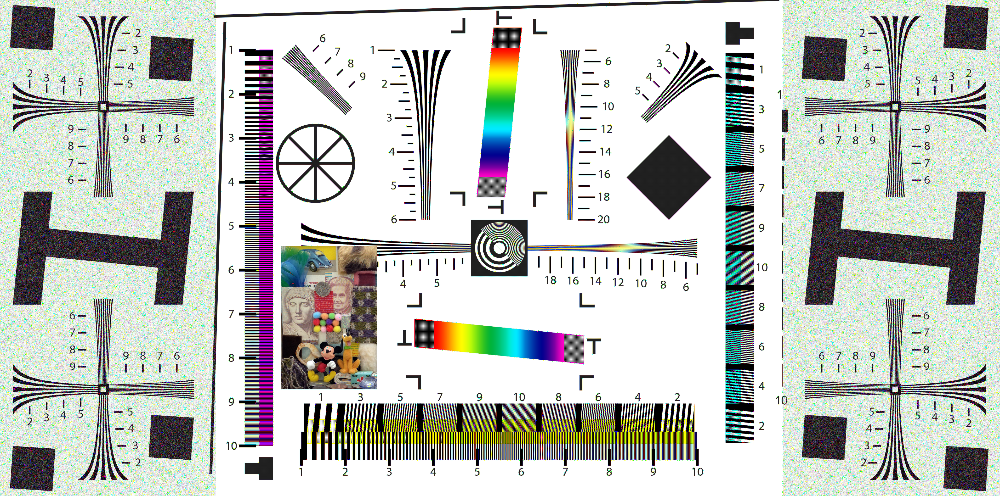

In [71]:
Image.fromarray(np.array(res, dtype=np.uint8))

In [73]:
Image.fromarray(np.array(res, dtype=np.uint8)).save('result.bmp')

## Время работы

Смещения + цвета = 6 + 1029 = 1035 sec

In [76]:
np.prod(cfa_np.shape) / 10**6

8.656848

In [77]:
1035/8.66

119.5150115473441

Мегапикселей: 8.66

сек/мп: 119.52

## Разрешение

На оригинальной и восстановленной фотографиях видны одинаковое количество полос, значит разрешение не уменьшилось. А вот цвет немного исказился: вв местах, где близки черные полоски, видно позеленение, кое-где появился желтый цвет

## PSNR

In [78]:
def Y(value):
    r, g, b = value
    return 0.299 * r + 0.587 * g + 0.114 * b

In [79]:
w = matrix.shape[1]
h = matrix.shape[0]

y = np.apply_along_axis(Y, -1, res)

ORIGINAL = Image.open("Original.bmp") 

y_ref = np.apply_along_axis(Y, -1, np.array(ORIGINAL))

mse = 1 / (w * h) * np.sum((y - y_ref) ** 2)

PSNR = 10 * np.log10(255 ** 2 / mse)

In [86]:
print('PSNR:{:.2f} db'.format(PSNR))

PSNR:24.23 db
